In [1]:
import os, sys
import numpy as np
import pandas as pd
import xarray as xr

import scipy.io as sio
from scipy import stats
from scipy import ndimage
from scipy.interpolate import griddata
import math
import random

import time
import datetime
from datetime import date
from datetime import timedelta
from datetime import datetime

import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.font_manager import FontProperties
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon
import matplotlib.cm as cm
import matplotlib.mlab as mlab
from matplotlib.ticker import MultipleLocator
import matplotlib.dates as mdates
from matplotlib.dates import AutoDateLocator, DateFormatter
from matplotlib.dates import DayLocator, HourLocator, DateFormatter, drange
from mpl_toolkits.basemap import Basemap

import xlrd 
import xlwt 
import xlsxwriter
import pathlib
from pathlib import Path

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingClassifier
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error , r2_score
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

In [2]:
np.set_printoptions(formatter={'float': '{: 0.1f}'.format})

matplotlib.rcParams['font.sans-serif'] = 'Times New Roman'
#matplotlib.rcParams['font.sans-serif'] = ['SimHei']
matplotlib.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.sans-serif'] = ['Times New Roman'] 
#plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus']=False 

def get_filename(filename):
  (filepath,tempfilename) = os.path.split(filename);
  (shotname,extension) = os.path.splitext(tempfilename);
  #return filepath, shotname, extension
  return shotname

def Normaltime(str_time_input):
    Normaltime_output = datetime.strptime(str_time_input,'%Y-%m-%d %H_%M')
    return Normaltime_output

def Changestr(datetime_input):
    str_output = datetime_input.strftime('%Y-%m-%d %H:%M')
    return str_output

def TS(x):
    return (x - np.datetime64('1970-01-01T00:00:00Z'))/np.timedelta64(1, 's')
    #return datetime.utcfromtimestamp(x.astype('O')/1e9)
    #return datetime.fromtimestamp(x.tolist()/1e9)

def DT(x):
    return datetime.utcfromtimestamp(x)

def quantile_clip(group):
    group.plot()
    group[group < group.quantile(.02)] = group.quantile(.02)
    group[group > group.quantile(.98)] = group.quantile(.98)
    #group.plot()
    #plt.show()
    return group

def flat(nums):
    res = []
    for i in nums:
        if isinstance(i, list):
            res.extend(flat(i))
        else:
            res.append(i)
    return res

def excel_to_df(xlsx):
    df=pd.DataFrame(pd.read_excel(xlsx, sheet_name=get_filename(xlsx)))
    return df

In [3]:
file_PhotoRGB_AQI_Met = 'PhotoRGB_AQI_Met.xlsx'
PhotoRGB_AQI_Met=excel_to_df(file_PhotoRGB_AQI_Met)

In [4]:
print(PhotoRGB_AQI_Met.columns.values.tolist())

['Time', 'R_R_M', 'G_R_M', 'B_R_M', 'R_L_M', 'G_L_M', 'B_L_M', 'PM2.5', 'PM10', 'SO2', 'NO2', 'O3', 'CO', 'T2m', 'BLH', 'U10', 'V10', 'TP', 'SP', 'T_500', 'RH_500', 'U_500', 'V_500', 'GP_500', 'T_700', 'RH_700', 'U_700', 'V_700', 'GP_700', 'T_850', 'RH_850', 'U_850', 'V_850', 'GP_850']


In [5]:
def getdata_day(df):
    va=df.columns.values.tolist()
    day=df[va][df['R_R_M'] > 100]
    return day

def getdata_night(df):
    va=df.columns.values.tolist()
    night=df[va][df['R_R_M'] <100]
    return night

In [6]:
dfs1_day=getdata_day(PhotoRGB_AQI_Met)
dfs1_night=getdata_night(PhotoRGB_AQI_Met)
print(dfs1_day.shape,dfs1_night.shape)

(3563, 34) (3119, 34)


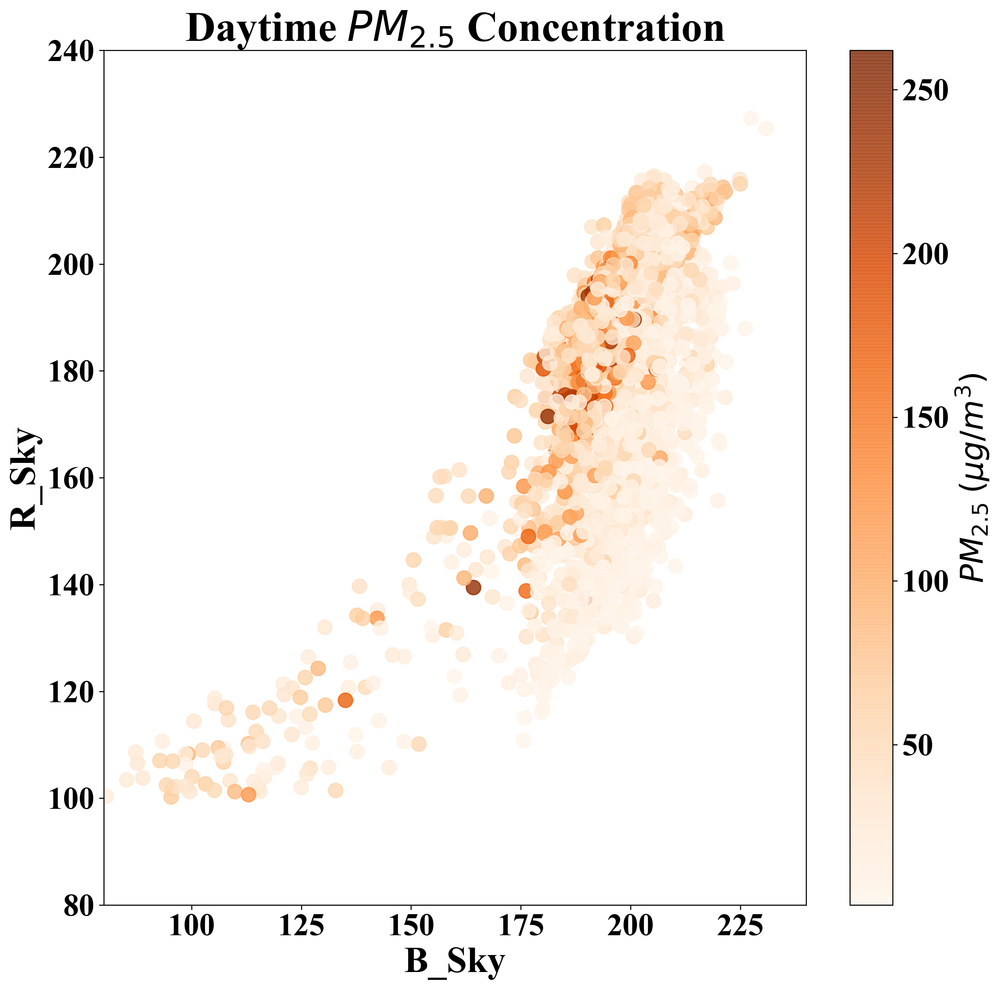

In [7]:
df=dfs1_day

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)
plt.ylim(80,240)
plt.xlim(80,240)

plt.xlabel('B_Sky',fontsize=28)
plt.ylabel('R_Sky',fontsize=28)
plt.scatter(B_Sky,R_Sky,s=120,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='Daytime $PM_{2.5}$ Concentration'
plt.title(titlestr,fontsize=32)
plt.savefig(str(titlestr)+'.png')

plt.show()

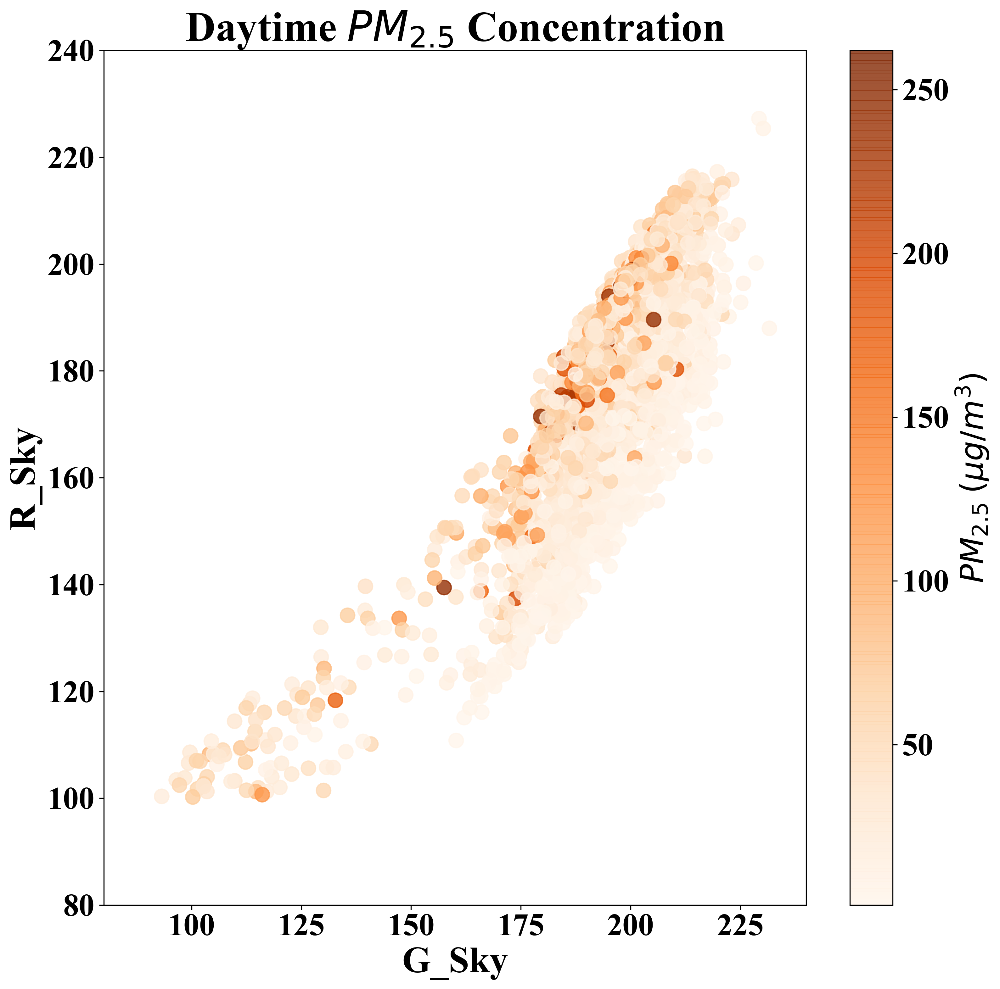

In [8]:
df=dfs1_day

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)
plt.ylim(80,240)
plt.xlim(80,240)

plt.xlabel('G_Sky',fontsize=28)
plt.ylabel('R_Sky',fontsize=28)
plt.scatter(G_Sky,R_Sky,s=120,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='Daytime $PM_{2.5}$ Concentration'
plt.title(titlestr,fontsize=32)
plt.savefig(str(titlestr)+'.png')

plt.show()

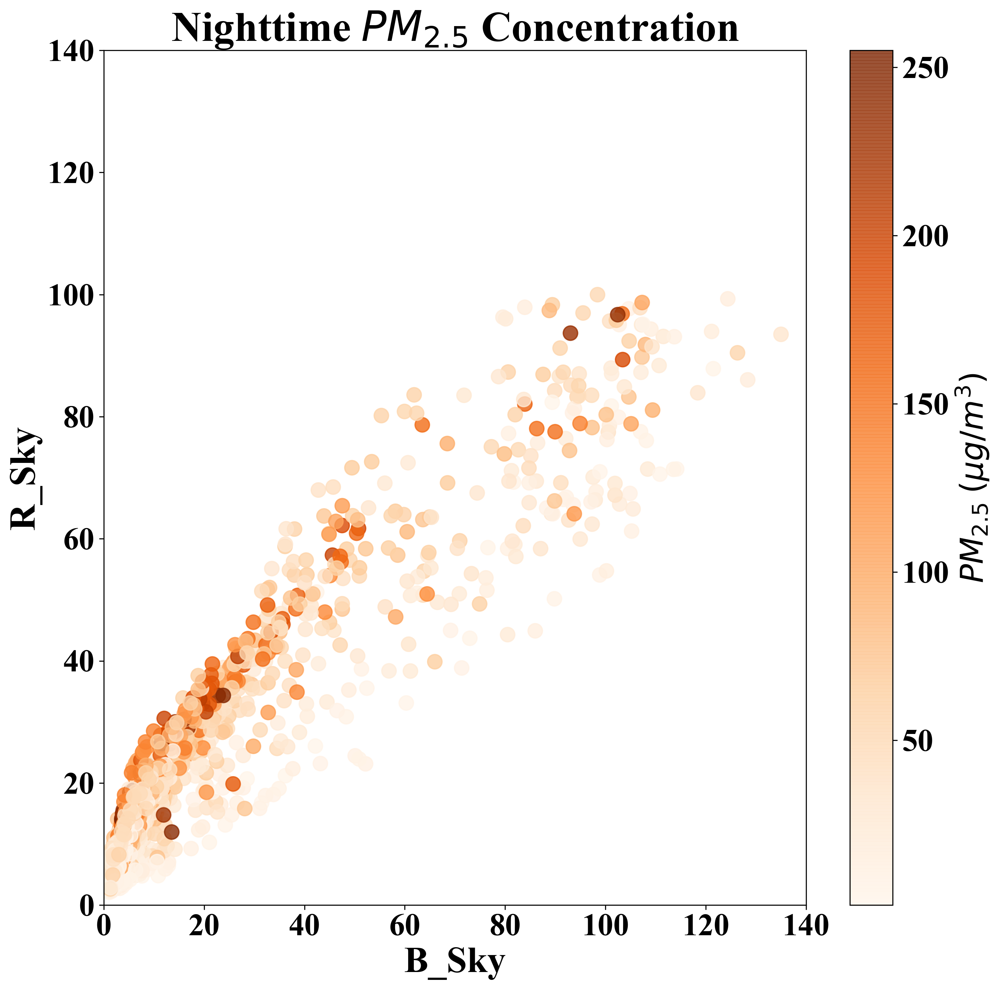

In [9]:
df=dfs1_night

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)
plt.ylim(0,140)
plt.xlim(0,140)

plt.xlabel('B_Sky',fontsize=28)
plt.ylabel('R_Sky',fontsize=28)
plt.scatter(B_Sky,R_Sky,s=120,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='Nighttime $PM_{2.5}$ Concentration'
plt.title(titlestr,fontsize=32)
plt.savefig(str(titlestr)+'.png')

plt.show()

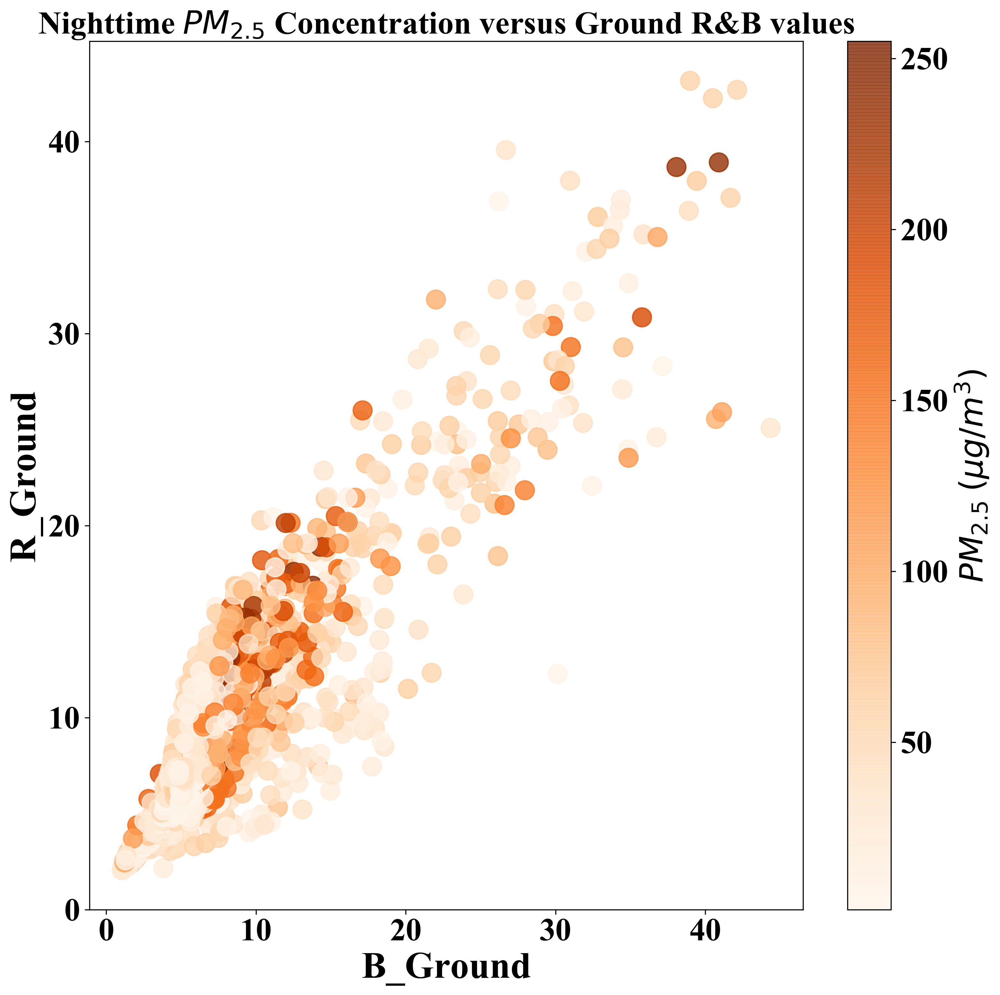

In [19]:
df=dfs1_night

PM25=df['PM2.5']
R_Sky=df['R_L_M']
B_Sky=df['B_L_M']
G_Sky=df['G_L_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)
#plt.ylim(0,140)
#plt.xlim(0,140)

plt.xlabel('B_Ground',fontsize=28)
plt.ylabel('R_Ground',fontsize=28)
plt.scatter(B_Sky,R_Sky,s=200,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='Nighttime $PM_{2.5}$ Concentration versus Ground R&B values'
plt.title(titlestr,fontsize=24)
plt.savefig(str(titlestr)+'.png')

plt.show()

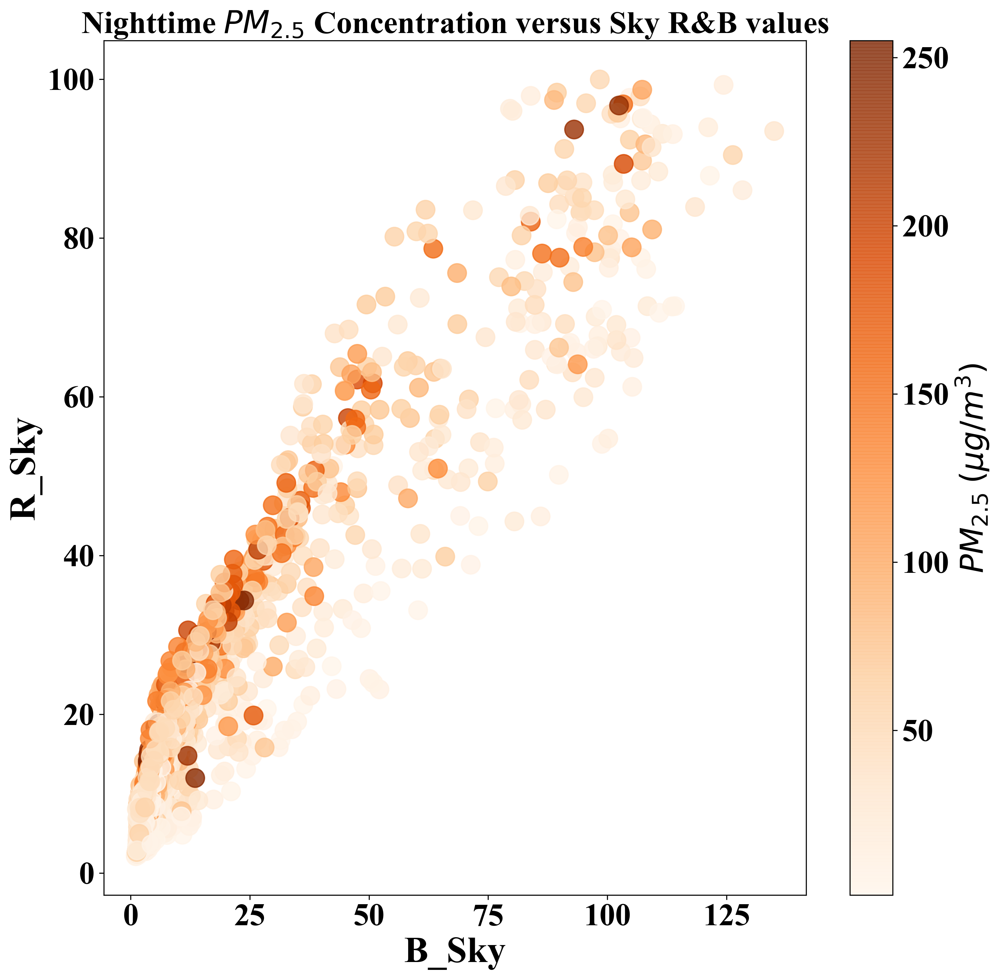

In [23]:
df=dfs1_night

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)
#plt.ylim(0,140)
#plt.xlim(0,140)

plt.xlabel('B_Sky',fontsize=28)
plt.ylabel('R_Sky',fontsize=28)
plt.scatter(B_Sky,R_Sky,s=200,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='Nighttime $PM_{2.5}$ Concentration versus Sky R&B values'
plt.title(titlestr,fontsize=24)
plt.savefig(str(titlestr)+'.png')

plt.show()

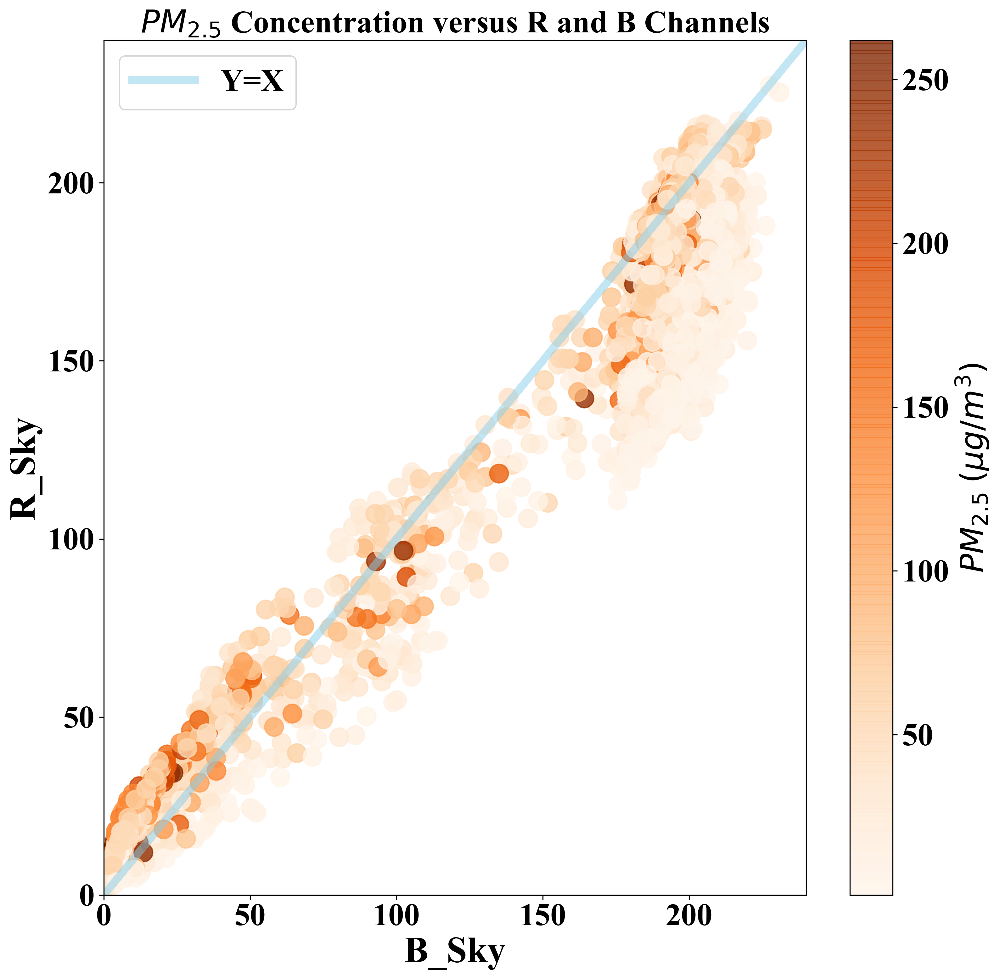

In [11]:
df=PhotoRGB_AQI_Met

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)

plt.ylim(0,240)
plt.xlim(0,240)

x = np.arange(0, 400, 0.1)
y=x
plt.plot(x, y,c='skyblue',label='Y=X', alpha=0.5,linewidth=6)
plt.legend(loc='upper left',fontsize=24)

plt.xlabel('B_Sky',fontsize=28)
plt.ylabel('R_Sky',fontsize=28)
plt.scatter(B_Sky,R_Sky,s=200,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='$PM_{2.5}$ Concentration versus R and B Channels'
plt.title(titlestr,fontsize=24)
plt.savefig(str(titlestr)+'.png')

plt.show()

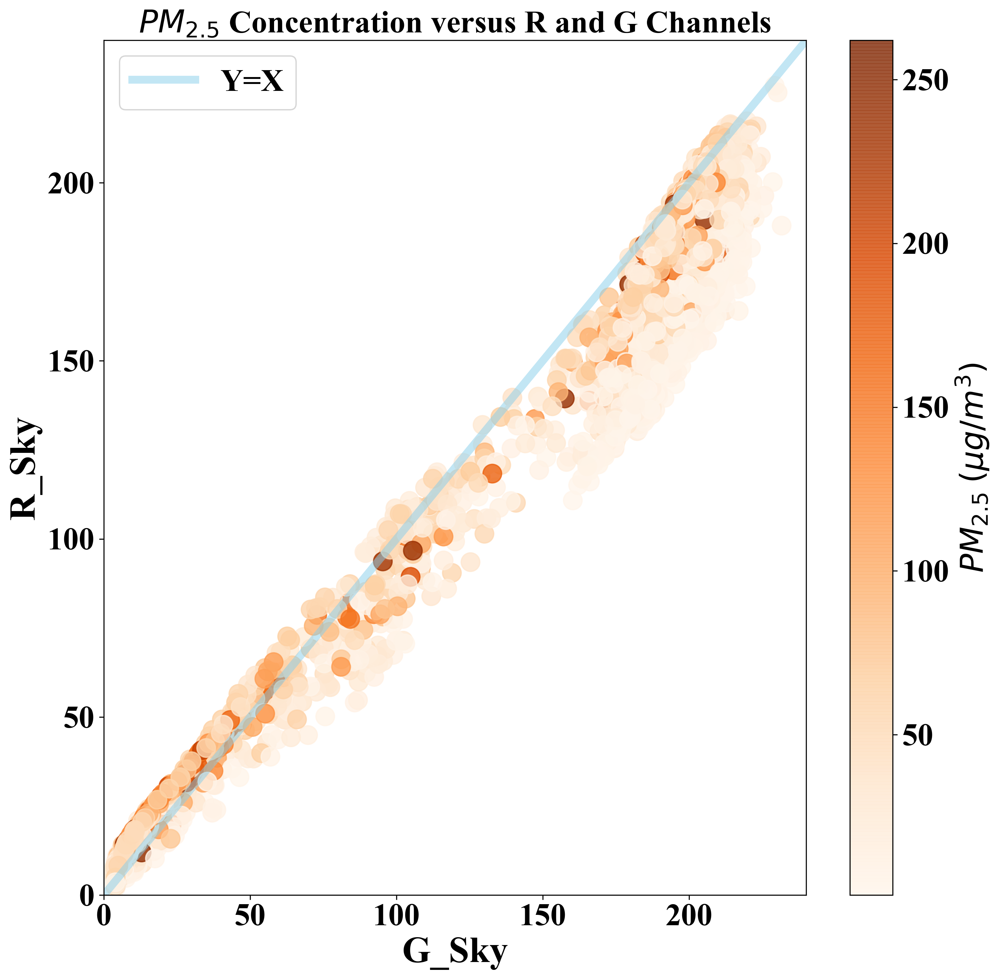

In [12]:
df=PhotoRGB_AQI_Met

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)

plt.ylim(0,240)
plt.xlim(0,240)

x = np.arange(0, 400, 0.1)
y=x
plt.plot(x, y,c='skyblue',label='Y=X', alpha=0.5,linewidth=6)
plt.legend(loc='upper left',fontsize=24)

plt.xlabel('G_Sky',fontsize=28)
plt.ylabel('R_Sky',fontsize=28)
plt.scatter(G_Sky,R_Sky,s=200,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='$PM_{2.5}$ Concentration versus R and G Channels'
plt.title(titlestr,fontsize=24)
plt.savefig(str(titlestr)+'.png')

plt.show()

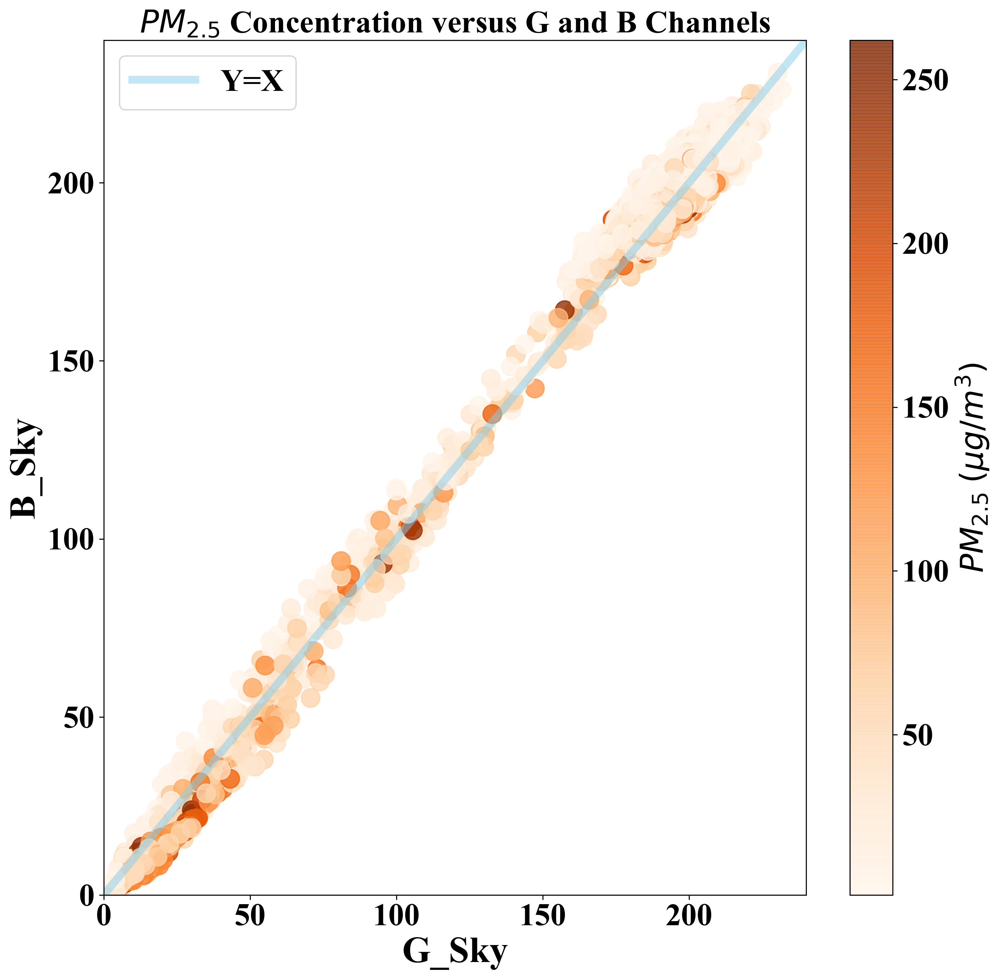

In [13]:
df=PhotoRGB_AQI_Met

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig, ax = plt.subplots(1,1,figsize=(12,12), dpi= 300)
plt.tick_params(labelsize=24)

plt.ylim(0,240)
plt.xlim(0,240)

x = np.arange(0, 400, 0.1)
y=x
plt.plot(x, y,c='skyblue',label='Y=X', alpha=0.5,linewidth=6)
plt.legend(loc='upper left',fontsize=24)

plt.xlabel('G_Sky',fontsize=28)
plt.ylabel('B_Sky',fontsize=28)
plt.scatter(G_Sky,B_Sky,s=200,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='$PM_{2.5}$ Concentration versus G and B Channels'
plt.title(titlestr,fontsize=24)
plt.savefig(str(titlestr)+'.png')

plt.show()

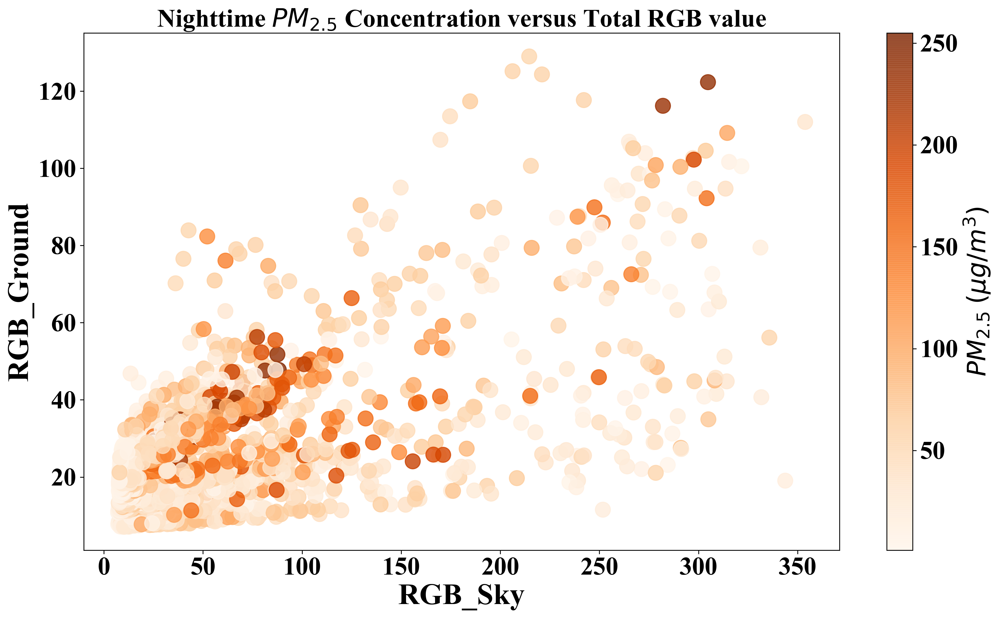

In [14]:
#df=PhotoRGB_AQI_Met
df=dfs1_night
PM25=df['PM2.5']

RGB_Sky = df['R_R_M']+df['G_R_M']+df['B_R_M']
RGB_Ground = df['R_L_M']+df['G_L_M']+df['B_L_M']

fig, ax = plt.subplots(1,1,figsize=(16,9), dpi= 300)
plt.tick_params(labelsize=24)

#plt.ylim(0,120)
#plt.xlim(0,120)

plt.xlabel('RGB_Sky',fontsize=28)
plt.ylabel('RGB_Ground',fontsize=28)
plt.scatter(RGB_Sky,RGB_Ground,s=200,marker='o', alpha=0.8, c=PM25, cmap='Oranges')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=24)
cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='Nighttime $PM_{2.5}$ Concentration versus Total RGB value'
plt.title(titlestr,fontsize=24)
plt.savefig(str(titlestr)+'.png')

plt.show()

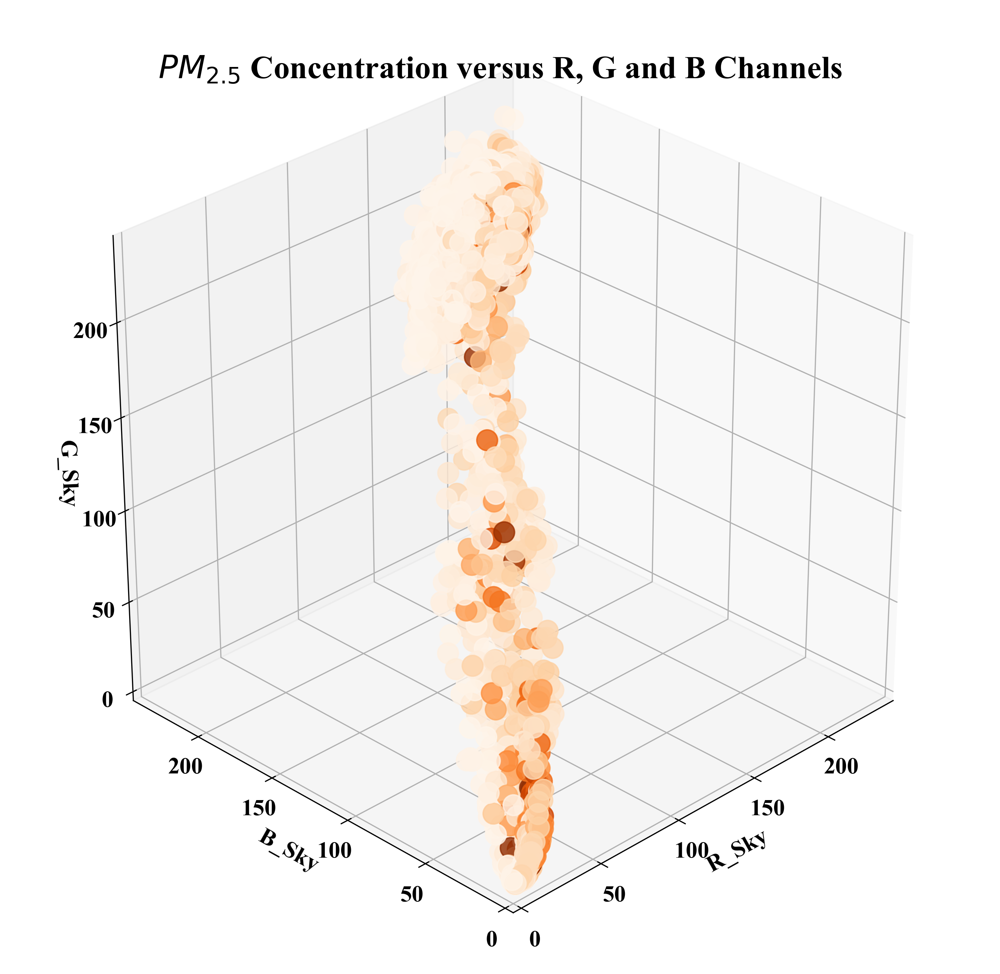

In [15]:
from mpl_toolkits.mplot3d import Axes3D
df=PhotoRGB_AQI_Met

PM25=df['PM2.5']
R_Sky=df['R_R_M']
B_Sky=df['B_R_M']
G_Sky=df['G_R_M']

fig = plt.subplots(1,1,figsize=(12,12), dpi= 300)
ax = plt.axes(projection='3d')
plt.tick_params(labelsize=16)

ax.set_ylim(0,240)
ax.set_xlim(0,240)
ax.set_zlim(0,240)

#plt.scatter3D(xd,yd,zd, cmap='Blues') 
ax.scatter(R_Sky,B_Sky,G_Sky,alpha=0.8,c=PM25,s=200,marker='o',cmap='Oranges')  
ax.set_xlabel('R_Sky',fontsize=16)
ax.set_ylabel('B_Sky',fontsize=16)
ax.set_zlabel('G_Sky',fontsize=16)

#cbar = ax.colorbar()
#cbar.ax.tick_params(labelsize=24)
#cbar.set_label('$PM_{2.5}$'+ ' '+'$ (µg/m^3)$',fontsize=24)
titlestr='$PM_{2.5}$ Concentration versus R, G and B Channels'
plt.title(titlestr,fontsize=22)

angle=225
ax.view_init(30, angle)
#plt.show()
plt.savefig(str(titlestr)+str(angle)+'.png')